In [1]:
import numpy as np
from astropy.visualization import make_lupton_rgb
import torch
import torchvision
from torchvision.models.detection.rpn import AnchorGenerator
from torch.utils.data import DataLoader, Dataset
from utils.tool import Averager, collate_fn

from CSST import CSSTimg

In [63]:
model_ft = torchvision.models.detection.retinanet_resnet50_fpn(pretrained=True)
# model_ft.load_state_dict(torch.load("model/Retina1019.bin"))

trained_model_name = "/data/jdli/model/Retina1019_mag23.bin"
model_ft.load_state_dict(torch.load(trained_model_name))

device = torch.device("cpu")
model_ft = model_ft.to(device)
model_ft.eval()

for param in model_ft.parameters():
    param.requires_grad = False


img_dir = "/data/jdli/C3test/img"
tgt_dir = "/data/jdli/C3test/target_mag23/"
c3val   = CSSTimg(img_dir, tgt_dir)

print(len(c3val.img_names), len(c3val.cat_names))

320 320


In [64]:
from tqdm import tqdm

valid_data_loader = DataLoader(
    c3val,
    batch_size=4, shuffle=True, num_workers=8,
    collate_fn=collate_fn
)

# images_val, targets_val = next(iter(valid_data_loader))
# images_val = list(image for image in images_val)
# targets_val = [{k: v for k, v in t.items()} for t in targets_val]


# outputs = model_ft(images_val)
# outputs = [{k: v.to(device) for k, v in t.items()} for t in outputs]

images, targets = [], []
outputs = []

for image, target in tqdm(valid_data_loader):

    images += list(img.to(device) for img in image)
    targets += [{k: v for k, v in t.items()} for t in target]

    output = model_ft(image)
    outputs += [{k: v.to(device) for k, v in t.items()} for t in output]

print(len(images), len(targets), len(outputs))

100%|██████████████████████████████████████████████████████████████████████| 80/80 [08:56<00:00,  6.70s/it]

320 320 320


In [ ]:
val_idx = np.random.randint(0, len(images), 5)

In [65]:
# vis_img  = [images_val[i]   for i in range(4)]
# vis_pred = [outputs[i]      for i in range(4)]
# vis_true = [targets_val[i]  for i in range(4)]

# val_idx = np.random.randint(0, len(images), 5)

vis_img  = [images[idx]  for idx in val_idx]
vis_pred = [outputs[idx] for idx in val_idx]
vis_true = [targets[idx] for idx in val_idx]

In [66]:
[c3val.img_names[idx] for idx in val_idx]

['/data/jdli/C3test/img/img14chip8.fits',
 '/data/jdli/C3test/img/img9chip9.fits',
 '/data/jdli/C3test/img/img18chip4.fits',
 '/data/jdli/C3test/img/img6chip14.fits',
 '/data/jdli/C3test/img/img0chip12.fits']

In [52]:
%pylab
%matplotlib inline
%config InlineBackend.figure_format='retina'

Using matplotlib backend: agg
Populating the interactive namespace from numpy and matplotlib


/home/jdli/anaconda3/envs/phot/lib/python3.9/site-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['box']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


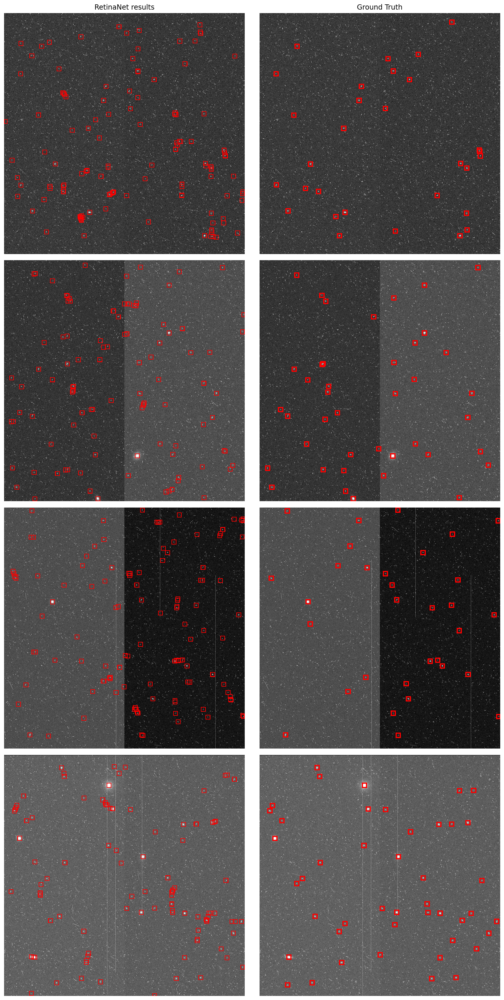

In [67]:
plot_num = 4


fig, axs = plt.subplots(plot_num,2, figsize=(13, 6*plot_num))

for i in range(plot_num):
    im = vis_img[i].reshape(2308, 2304)
    ax1, ax2 = axs[i,:]
    ax1.imshow(im, vmin=0.2, vmax=1, cmap='gray')
    ax1.set_axis_off()
    
    boxes = vis_pred[i]['boxes'][:,0:4]
    for box in boxes:
        ax1.add_patch(
            Rectangle(
                (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                edgecolor='red',facecolor='none', lw=1
                )
            )
    if i == 0:
        ax1.set_title('RetinaNet results');

    boxes_truth = vis_true[i]['boxes']
    ax2.imshow(im, vmin=0.2, vmax=1, cmap='gray')
    ax2.set_axis_off()

    for box in boxes_truth:
        ax2.add_patch(
            Rectangle(
                (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                edgecolor='red',facecolor='none', lw=2
                )
            )
    if i == 0:
        ax2.set_title('Ground Truth');
        
plt.tight_layout()

In [72]:
from torchvision.ops import nms, remove_small_boxes

def post_process_box(boxes, scores, labels, score_threshold=0.2, 
                     iou_threshold=0.2, min_size=1):
    
    idx_nms = nms(boxes=boxes, scores=scores, iou_threshold=iou_threshold)
    idx_rmv_small = remove_small_boxes(boxes=boxes, min_size=min_size)
    idx_score = np.nonzero(scores>score_threshold)
    
    idx_post = np.intersect1d(idx_nms, idx_rmv_small)
    idx_post = np.intersect1d(idx_post, idx_score)
    
    return {'boxes':boxes[idx_post], 'scores':scores[idx_post], 'labels':labels[idx_post]}

def ground_truth(target):
    gt = np.c_[target['boxes'], target['labels']]
    gt = np.insert(gt, 5, values=0, axis=1)
    gt = np.insert(gt, 6, values=0, axis=1)
    return gt


def pred_result(output, score=0.2, iou=0.2):
    output = post_process_box(
        output['boxes'], output['scores'], output['labels'], 
        score_threshold=score, iou_threshold=iou
    )
    pred = np.c_[output['boxes'], output['labels'], output['scores']]
    return pred



gts   = [ground_truth(target)  for target in vis_true]
preds = [pred_result(output, score=0.3, iou=0.2) for output in vis_pred]

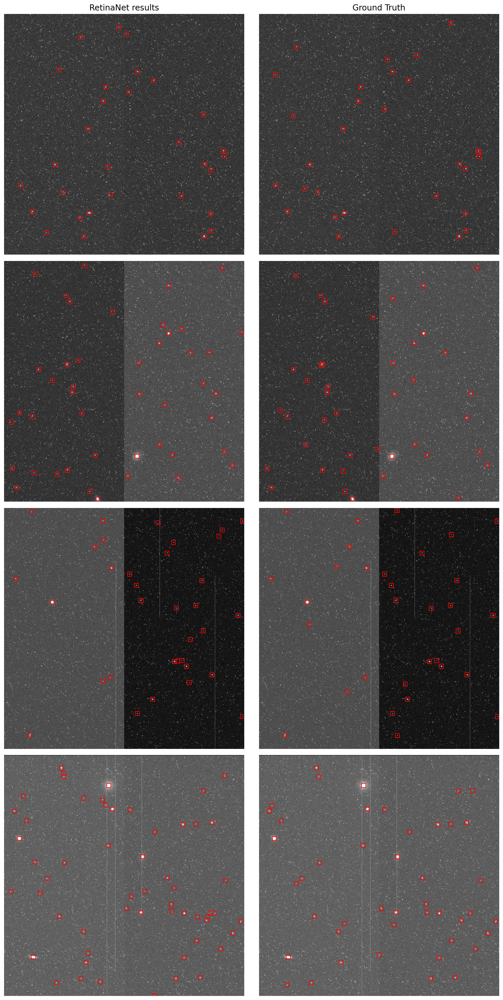

In [73]:
plot_num = 4

fig, axs = plt.subplots(plot_num,2, figsize=(13, 6*plot_num))
# ax1, ax2 = axs.ravel()

for i in range(plot_num):
    im = vis_img[i].reshape(2308, 2304)
    ax1, ax2 = axs[i,:]
    ax1.imshow(im, vmin=0.2, vmax=1, cmap='gray')
    ax1.set_axis_off()

    boxes = preds[i][:,0:4]
    for box in boxes:
        ax1.add_patch(
            Rectangle(
                (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                edgecolor='red',facecolor='none', lw=1
                )
            )
    if i == 0:
        ax1.set_title('RetinaNet results', fontsize=14);


    boxes_truth = gts[i][:, 0:4]
    ax2.imshow(im, vmin=0.2, vmax=1, cmap='gray')
    ax2.set_axis_off()

    for box in boxes_truth:
        ax2.add_patch(
            Rectangle(
                (box[0], box[1]), box[2]-box[0], box[3]-box[1],
                edgecolor='red',facecolor='none', lw=1
                )
            )
    if i == 0:
        ax2.set_title('Ground Truth', fontsize=14);
        
plt.tight_layout()

In [29]:
from mean_average_precision import MetricBuilder

metric_fn = MetricBuilder.build_evaluation_metric("map_2d", async_mode=True, num_classes=3)


In [74]:
for i in range(len(preds)):
    metric_fn.add(preds[i], gts[i])

    
iou = 0.5
print(metric_fn.value(iou_thresholds=iou, recall_thresholds=np.arange(0., 1.1, 0.1))['mAP'])
print(metric_fn.value(iou_thresholds=iou)['mAP'])

print(
    "Galaxy AP = %.2f \nStar   AP = %.2f \nAGN    AP = %.2f"%
    (metric_fn.value()[iou][0]['ap'], 
    metric_fn.value()[iou][1]['ap'], 
    metric_fn.value()[iou][2]['ap'])
)

0.43458164
0.4326804
Galaxy AP = 0.83 
Star   AP = 0.37 
AGN    AP = 0.09


In [75]:
from tqdm import tqdm

score_lst = [0.1, 0.2, 0.3, 0.4, 0.5]
iou_lst   = [0.1, 0.2, 0.3, 0.4, 0.5]

galaxy_aps = []; star_aps = []; agn_aps = []

for score in tqdm(score_lst):
    for iou in iou_lst:
        
        preds = [pred_result(output, score=score, iou=iou) for output in vis_pred]
        for i in range(len(preds)):
            metric_fn.add(preds[i], gts[i])
            
        galaxy_aps.append(metric_fn.value()[0.5][0]['ap'])
        star_aps.append(  metric_fn.value()[0.5][1]['ap'])
        agn_aps.append(   metric_fn.value()[0.5][2]['ap'])

100%|████████████████████████████████████████████████████████████████████████| 5/5 [03:11<00:00, 38.25s/it]
